In [94]:
import os
import numpy as np
import pandas as pd
import pma_python
from pma_python import core
import tqdm
from tqdm import tqdm
import numpy as np
from PIL import Image, ImageDraw
import cv2
import matplotlib.pyplot as plt

In [95]:
pwd

'/drive3/Anshuman/testing_project/image_registration_2/whomography/sanitycheck'

In [96]:
import cv2
import numpy as np

def tile_wise_registration(reference_image, target_image,n, tile_size=(256, 256)):
    # Convert images to grayscale
    reference_gray = cv2.cvtColor(reference_image, cv2.COLOR_BGR2GRAY)
    target_gray = cv2.cvtColor(target_image, cv2.COLOR_BGR2GRAY)

    # Initialize ORB detector
    orb = cv2.ORB_create(nfeatures=n)

    # Find keypoints and descriptors with ORB
    keypoints1, descriptors1 = orb.detectAndCompute(reference_gray, None)
    keypoints2, descriptors2 = orb.detectAndCompute(target_gray, None)

    # Create BFMatcher (Brute Force Matcher) object
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

    # Match descriptors
    matches = bf.match(descriptors1, descriptors2)

    # Sort them in ascending order of distance
    matches = sorted(matches, key=lambda x: x.distance)

    # Extract matched points
    src_pts = np.float32([keypoints1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    # Estimate affine transformation
    transform_matrix = cv2.estimateAffinePartial2D(src_pts, dst_pts)[0]

    # Extract translation and rotation parameters
    tx = transform_matrix[0, 2]
    ty = transform_matrix[1, 2]
    rotation_rad = np.arctan2(transform_matrix[1, 0], transform_matrix[0, 0])

    # Convert rotation from radians to degrees
    rotation_deg = np.degrees(rotation_rad)

    # Apply the transformation to the target image
    registered_image = cv2.warpAffine(reference_image, transform_matrix, (target_image.shape[1], target_image.shape[0]))

    return registered_image, transform_matrix, tx, ty,rotation_deg



In [4]:
pwd

'/drive3/Anshuman/testing_project/image_registration_2/whomography/sanitycheck'

In [1]:
sessionID = core.connect('url', 'username', 'password')

NameError: name 'core' is not defined

In [19]:
ihc = 'CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01P0302CD20/CAIB-T00000594OC01R01P0302CD20.svs'
he  = 'CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01P0302HE/CAIB-T00000594OC01R01P0302HE.svs'



#w,h=core.get_pixel_dimensions(slide,sessionID=sessionID)
img=core.get_region(ihc,x=39500 - 2914.496308058708 ,y=33500 - 1924.9779087699828 ,width=8192,height=8192,scale=1,rotation= - 0.4714906888831345,sessionID=sessionID)
       
output_path = 'ihc_8192_shift.tiff'
img.save(output_path)

ihc: (8192, 8192)
he: (8192, 8192)


Text(0.5, 1.0, 'ihc_50x')

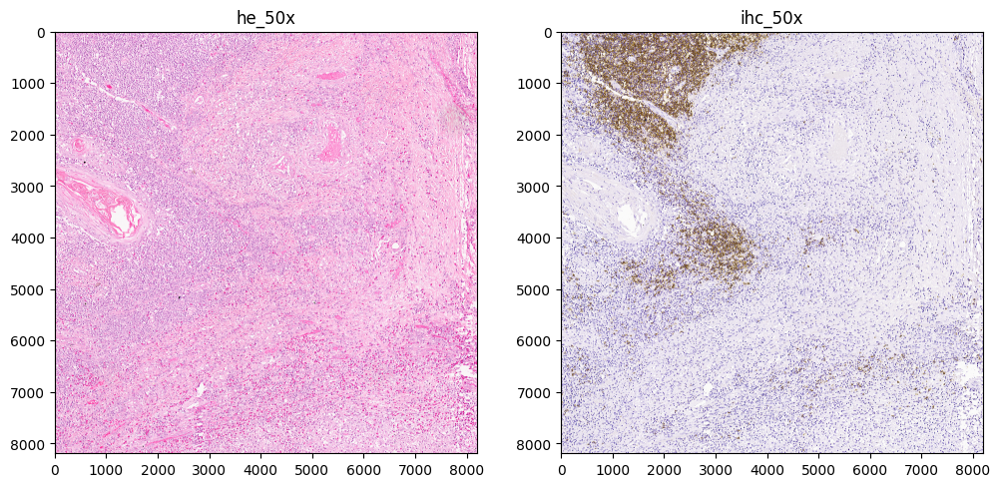

In [23]:
he = 'he_8192_shift.tiff'
ihc = 'ihc_8192_5.tiff'



ihc = Image.open(ihc)
he = Image.open(he)
print("ihc:",ihc.size)
print("he:",he.size)
fig, axes = plt.subplots(1,2,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he_50x")
axes[1].imshow(ihc)
axes[1].set_title("ihc_50x")

ihc: (8192, 8192)
he: (8192, 8192)


Text(0.5, 1.0, 'ihc_50x')

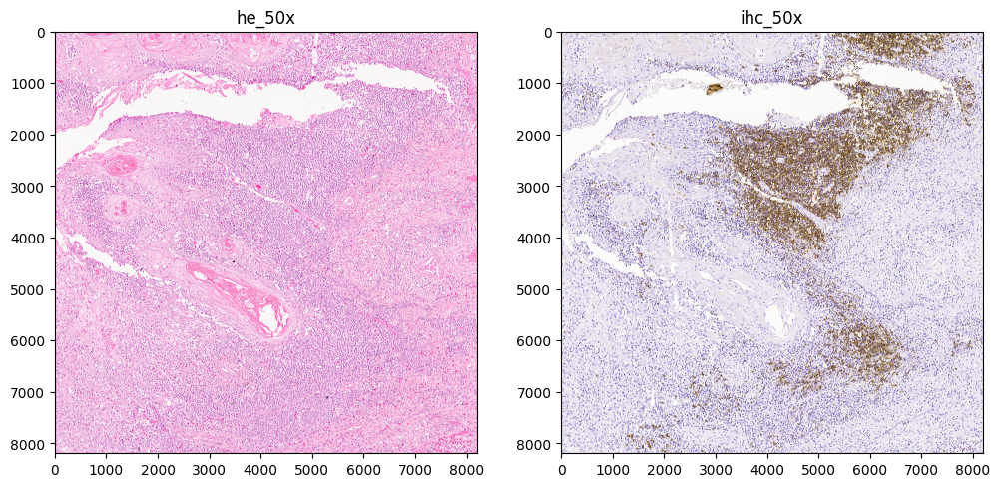

In [24]:
he = 'he_8192_5.tiff'
ihc = 'ihc_8192_shift.tiff'



ihc = Image.open(ihc)
he = Image.open(he)
print("ihc:",ihc.size)
print("he:",he.size)
fig, axes = plt.subplots(1,2,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he_50x")
axes[1].imshow(ihc)
axes[1].set_title("ihc_50x")

[[ 9.99923413e-01  8.22862041e-03 -2.91449631e+03]
 [-8.22862041e-03  9.99923413e-01 -1.92497791e+03]] -2914.496308058708 -1924.9779087699828 -0.4714906888831345


Text(0.5, 1.0, 'registered.tiff')

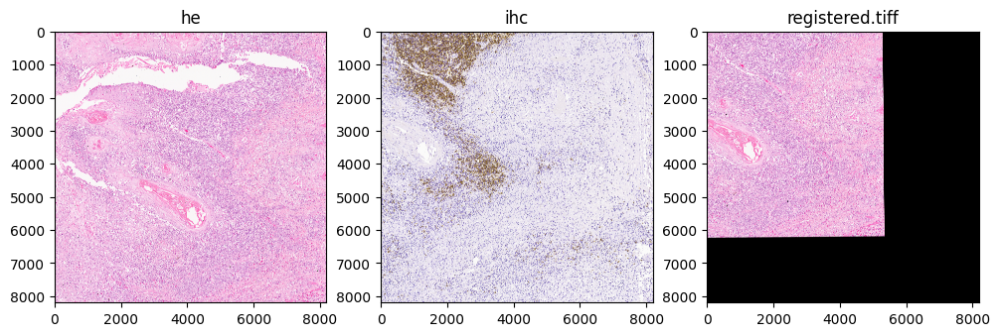

In [9]:
he = 'he_8192_5.tiff'
ihc = 'ihc_8192_5.tiff'


target_image = cv2.imread(ihc)
reference_image = cv2.imread(he)

registered_image, transformation_matrix,tx,ty,rotation_deg = tile_wise_registration(reference_image, target_image)
cv2.imwrite("registered_4.tiff", registered_image)
print(transformation_matrix,tx,ty,rotation_deg)



ihc = Image.open(ihc)
he = Image.open(he)
registered_image = Image.open("registered_4.tiff")
fig, axes = plt.subplots(1,3,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he")
axes[1].imshow(ihc)
axes[1].set_title("ihc")
axes[2].imshow(registered_image)
axes[2].set_title("registered.tiff")

In [21]:
import cv2
import os

# Load the TIFF image
image = cv2.imread('he_8192_shift.tiff', cv2.IMREAD_UNCHANGED)

# Get the dimensions of the image
height, width = image.shape[:2]

# Define the patch size
patch_size = 256

# Create the directory to save patches if it doesn't exist
save_dir = 'pa_he_2'
os.makedirs(save_dir, exist_ok=True)

# Iterate over the image and extract patches
for y in range(0, height, patch_size):
    for x in range(0, width, patch_size):
        patch = image[y:y+patch_size, x:x+patch_size]
        patch_filename = os.path.join(save_dir, f'patch_{y}_{x}.png')
        cv2.imwrite(patch_filename, patch)

In [29]:
ihc = 'CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01P0302CD20/CAIB-T00000594OC01R01P0302CD20.svs'
he  = 'CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01P0302HE/CAIB-T00000594OC01R01P0302HE.svs'



#w,h=core.get_pixel_dimensions(slide,sessionID=sessionID)
img=core.get_region(he,x=38000 + 2900  ,y=30000 + 1900 ,width=8192,height=8192,scale=1,rotation= 0,sessionID=sessionID)
       
output_path = 'he_8192_a.tiff'
img.save(output_path)

ihc: (8192, 8192)
he: (8192, 8192)


Text(0.5, 1.0, 'ihc_50x')

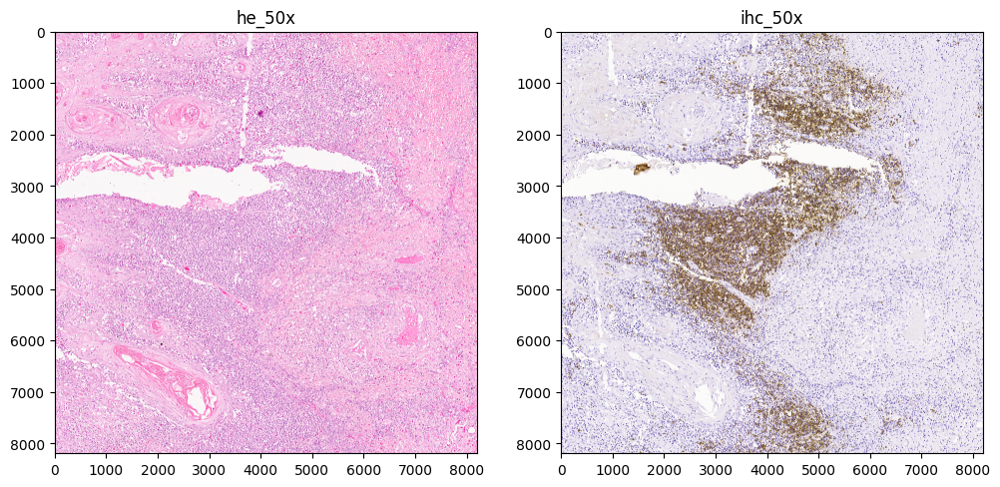

In [30]:
he = 'he_8192_a.tiff'
ihc = 'ihc_8192_a.tiff'



ihc = Image.open(ihc)
he = Image.open(he)
print("ihc:",ihc.size)
print("he:",he.size)
fig, axes = plt.subplots(1,2,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he_50x")
axes[1].imshow(ihc)
axes[1].set_title("ihc_50x")

[[ 9.99926970e-01  8.05409737e-03 -2.41523373e+01]
 [-8.05409737e-03  9.99926970e-01 -3.61925533e+01]] -24.152337280895896 -36.1925533235837 -0.46148951044434594


Text(0.5, 1.0, 'registered.tiff')

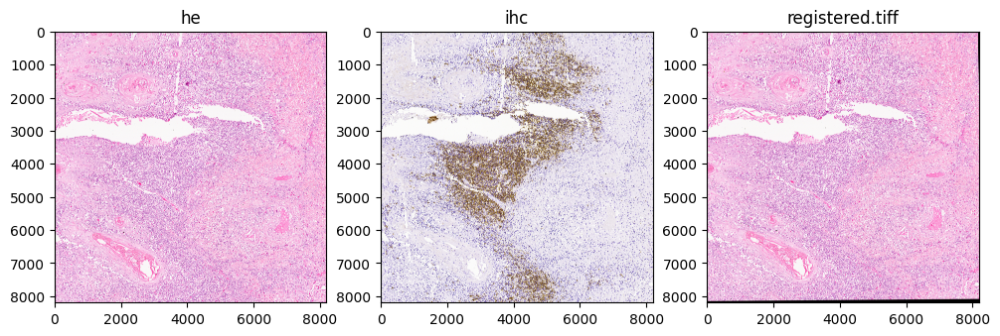

In [31]:
he = 'he_8192_a.tiff'
ihc = 'ihc_8192_a.tiff'


target_image = cv2.imread(he)
reference_image = cv2.imread(ihc)

registered_image, transformation_matrix,tx,ty,rotation_deg = tile_wise_registration(reference_image, target_image)
cv2.imwrite("registered_a.tiff", registered_image)
print(transformation_matrix,tx,ty,rotation_deg)



ihc = Image.open(ihc)
he = Image.open(he)
registered_image = Image.open("registered_a.tiff")
fig, axes = plt.subplots(1,3,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he")
axes[1].imshow(ihc)
axes[1].set_title("ihc")
axes[2].imshow(registered_image)
axes[2].set_title("registered.tiff")

In [33]:
ihc = 'CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01P0302CD20/CAIB-T00000594OC01R01P0302CD20.svs'
he  = 'CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01P0302HE/CAIB-T00000594OC01R01P0302HE.svs'



#w,h=core.get_pixel_dimensions(slide,sessionID=sessionID)
img=core.get_region(ihc,x=38000 - 24.152337280895896 ,y=30000 - 36.1925533235837 ,width=8192,height=8192,scale=1,rotation= -0.46148951044434594,sessionID=sessionID)
       
output_path = 'ihc_8192_a_shift.tiff'
img.save(output_path)

In [105]:
import cv2
import os

# Load the TIFF image
image = cv2.imread('ihc_8192_a_shift.tiff', cv2.IMREAD_UNCHANGED)

# Get the dimensions of the image
height, width = image.shape[:2]

# Define the patch size
patch_size = 256

# Create the directory to save patches if it doesn't exist
save_dir = 'pa_ihc_a'
os.makedirs(save_dir, exist_ok=True)

# Iterate over the image and extract patches
for y in range(0, height, patch_size):
    for x in range(0, width, patch_size):
        patch = image[y:y+patch_size, x:x+patch_size]
        patch_filename = os.path.join(save_dir, f'patch_{y}_{x}.png')
        cv2.imwrite(patch_filename, patch)

In [36]:
pwd

'/drive3/Anshuman/testing_project/image_registration_2/whomography/sanitycheck'

[[ 1.00680086 -0.01533905 -3.80669948]
 [ 0.01533905  1.00680086 -2.43267786]] -3.806699479767801 -2.432677863323261 0.8728584224471945


Text(0.5, 1.0, 'registered.tiff')

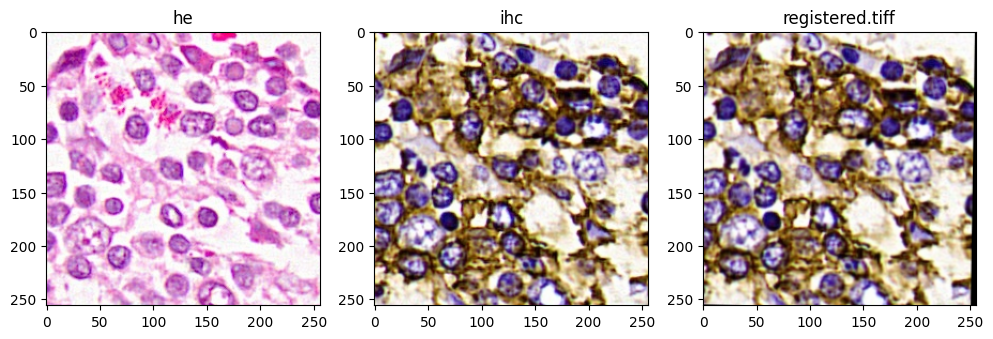

In [53]:
he = 'pa_he_a/patch_2560_4352.png'
ihc = 'pa_ihc_a/patch_2560_4352.png'


target_image = cv2.imread(he)
reference_image = cv2.imread(ihc)

registered_image, transformation_matrix,tx,ty,rotation_deg = tile_wise_registration(reference_image, target_image)
cv2.imwrite("registered_X.tiff", registered_image)
print(transformation_matrix,tx,ty,rotation_deg)



ihc = Image.open(ihc)
he = Image.open(he)
registered_image = Image.open("registered_X.tiff")
fig, axes = plt.subplots(1,3,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he")
axes[1].imshow(ihc)
axes[1].set_title("ihc")
axes[2].imshow(registered_image)
axes[2].set_title("registered.tiff")

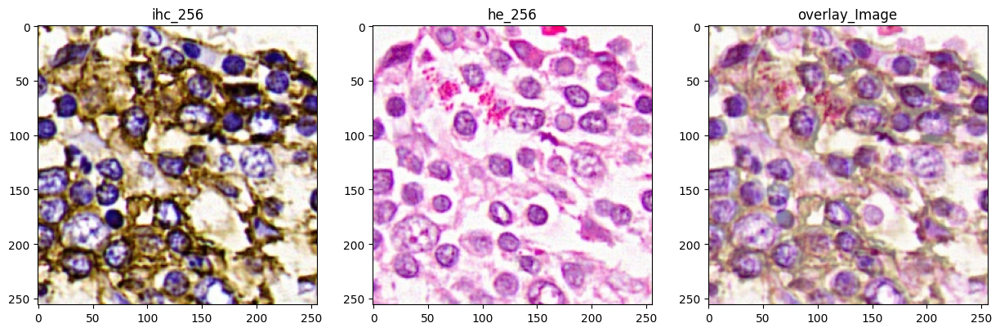

In [54]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image1_path = "pa_ihc_a/patch_2560_4352.png"
image1 = cv2.imread(image1_path)
image2_path = 'pa_he_a/patch_2560_4352.png'
image2 = cv2.imread(image2_path)




alpha = 0.5 
blended_image = cv2.addWeighted(image2, 1 - alpha, image1, alpha, 0)

# Display all three images using subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Original Image 1
axs[0].imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
axs[0].set_title('ihc_256')

# Original Image 2
axs[1].imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
axs[1].set_title('he_256')

# Blended Image
axs[2].imshow(cv2.cvtColor(blended_image, cv2.COLOR_BGR2RGB))
axs[2].set_title('overlay_Image')

plt.show()

[[ 1.00353029 -0.03258479 11.87889922]
 [ 0.03258479  1.00353029 -4.37493827]] 11.8788992153915 -4.374938266851215 1.8597498873474347


Text(0.5, 1.0, 'registered.tiff')

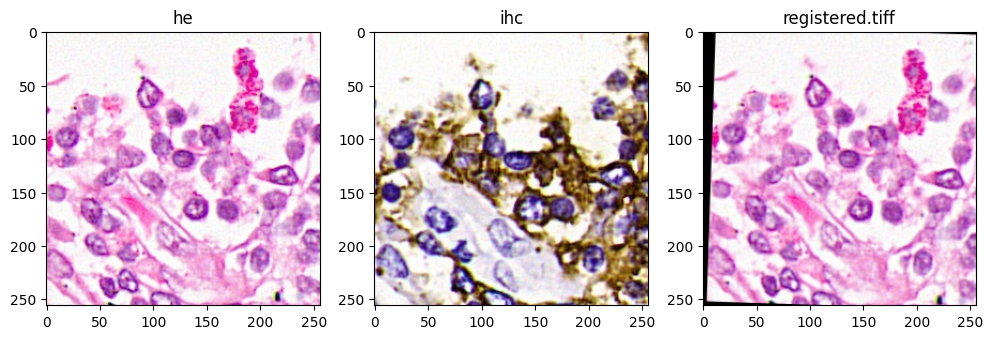

In [61]:
he = 'pa_he_a/patch_2560_4096.png'
ihc = 'pa_ihc_a/patch_2560_4096.png'


target_image = cv2.imread(ihc)
reference_image = cv2.imread(he)

registered_image, transformation_matrix,tx,ty,rotation_deg = tile_wise_registration(reference_image, target_image)
cv2.imwrite("registered_X.tiff", registered_image)
print(transformation_matrix,tx,ty,rotation_deg)



ihc = Image.open(ihc)
he = Image.open(he)
registered_image = Image.open("registered_X.tiff")
fig, axes = plt.subplots(1,3,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he")
axes[1].imshow(ihc)
axes[1].set_title("ihc")
axes[2].imshow(registered_image)
axes[2].set_title("registered.tiff")

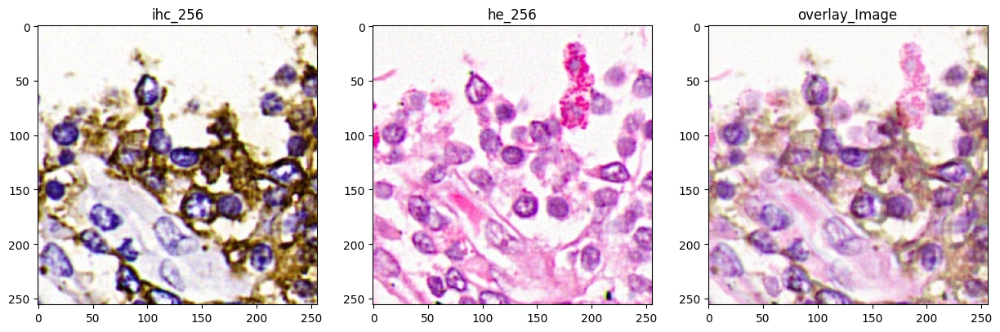

In [59]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image1_path = "pa_ihc_a/patch_2560_4096.png"
image1 = cv2.imread(image1_path)
image2_path = 'pa_he_a/patch_2560_4096.png'
image2 = cv2.imread(image2_path)




alpha = 0.5 
blended_image = cv2.addWeighted(image2, 1 - alpha, image1, alpha, 0)

# Display all three images using subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Original Image 1
axs[0].imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
axs[0].set_title('ihc_256')

# Original Image 2
axs[1].imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
axs[1].set_title('he_256')

# Blended Image
axs[2].imshow(cv2.cvtColor(blended_image, cv2.COLOR_BGR2RGB))
axs[2].set_title('overlay_Image')

plt.show()

In [109]:
ihc = 'CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01P0302CD20/CAIB-T00000594OC01R01P0302CD20.svs'
he  = 'CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01P0302HE/CAIB-T00000594OC01R01P0302HE.svs'



#w,h=core.get_pixel_dimensions(slide,sessionID=sessionID)
img=core.get_region(ihc,x=52000 - 48.23042927138964 ,y= 64000 -61.198663976306946   ,width=4096,height=4096,scale= 1,rotation= -0.3847458091458988,sessionID=sessionID)
       
output_path = 'ihc_8192_b_shift.tiff'
img.save(output_path)

ihc: (4096, 4096)
he: (4096, 4096)


Text(0.5, 1.0, 'ihc_50x')

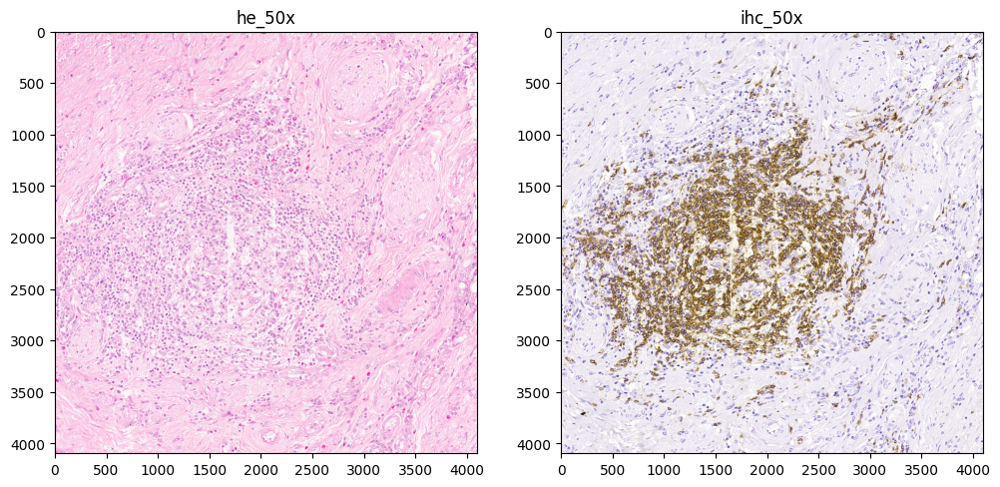

In [5]:
he = 'he_8192_b.tiff'
ihc = 'ihc_8192_b.tiff'



ihc = Image.open(ihc)
he = Image.open(he)
print("ihc:",ihc.size)
print("he:",he.size)
fig, axes = plt.subplots(1,2,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he_50x")
axes[1].imshow(ihc)
axes[1].set_title("ihc_50x")

[[ 1.00030125e+00 -1.01548068e-02  5.29513637e+01]
 [ 1.01548068e-02  1.00030125e+00  5.45380534e+01]] 52.95136365212092 54.53805343598077 0.5816323665931334


Text(0.5, 1.0, 'registered.tiff')

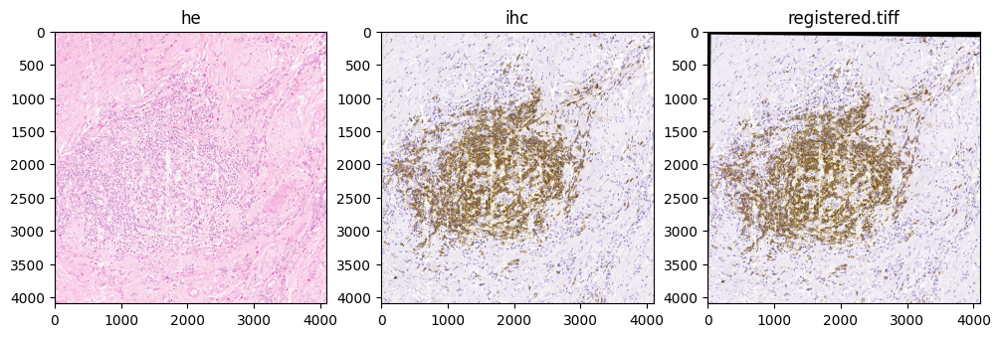

In [7]:
he = 'he_8192_b.tiff'
ihc = 'ihc_8192_b.tiff'


target_image = cv2.imread(he)
reference_image = cv2.imread(ihc)

registered_image, transformation_matrix,tx,ty,rotation_deg = tile_wise_registration(reference_image, target_image)
cv2.imwrite("registered_X.tiff", registered_image)
print(transformation_matrix,tx,ty,rotation_deg)



ihc = Image.open(ihc)
he = Image.open(he)
registered_image = Image.open("registered_X.tiff")
fig, axes = plt.subplots(1,3,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he")
axes[1].imshow(ihc)
axes[1].set_title("ihc")
axes[2].imshow(registered_image)
axes[2].set_title("registered.tiff")

[[ 1.00026489e+00  6.71696088e-03 -4.82304293e+01]
 [-6.71696088e-03  1.00026489e+00 -6.11986640e+01]] -48.23042927138964 -61.198663976306946 -0.3847458091458988


Text(0.5, 1.0, 'registered.tiff')

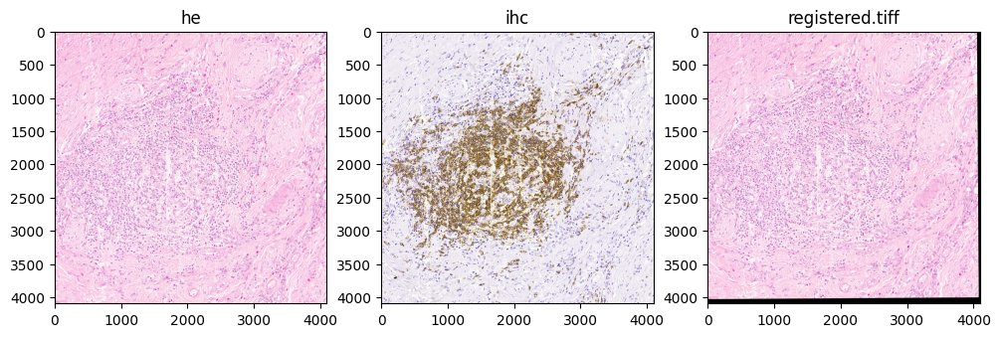

In [6]:
he = 'he_8192_b.tiff'
ihc = 'ihc_8192_b.tiff'


target_image = cv2.imread(ihc)
reference_image = cv2.imread(he)

registered_image, transformation_matrix,tx,ty,rotation_deg = tile_wise_registration(reference_image, target_image)
cv2.imwrite("registered_X.tiff", registered_image)
print(transformation_matrix,tx,ty,rotation_deg)



ihc = Image.open(ihc)
he = Image.open(he)
registered_image = Image.open("registered_X.tiff")
fig, axes = plt.subplots(1,3,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he")
axes[1].imshow(ihc)
axes[1].set_title("ihc")
axes[2].imshow(registered_image)
axes[2].set_title("registered.tiff")

In [113]:
import cv2
import os

# Load the TIFF image
image = cv2.imread('he_8192_b.tiff', cv2.IMREAD_UNCHANGED)

# Get the dimensions of the image
height, width = image.shape[:2]

# Define the patch size
patch_size = 256

# Create the directory to save patches if it doesn't exist
save_dir = 'pa_he_b'
os.makedirs(save_dir, exist_ok=True)

# Iterate over the image and extract patches
for y in range(0, height, patch_size):
    for x in range(0, width, patch_size):
        patch = image[y:y+patch_size, x:x+patch_size]
        patch_filename = os.path.join(save_dir, f'patch_{y}_{x}.png')
        cv2.imwrite(patch_filename, patch)

In [ ]:
import math

# Define the parameters
region_x = 39500 - 2914.496308058708
region_y = 33500 - 1924.9779087699828
width = 8192
height = 8192
scale = 1
rotation_degrees = -0.4714906888831345

# Define patch size
patch_size = 256

# Calculate the number of patches in each dimension
num_patches_x = width // patch_size
num_patches_y = height // patch_size

# Initialize a list to store the coordinates of each patch
patch_coordinates = []

# Generate coordinates for each patch
for i in range(num_patches_x):
    for j in range(num_patches_y):
        # Calculate the center of the patch
        center_x = region_x + i * patch_size + patch_size / 2
        center_y = region_y + j * patch_size + patch_size / 2
        
        # Rotate the center of the patch
        rotated_center_x = (center_x - region_x) * math.cos(rotation_degrees) - (center_y - region_y) * math.sin(rotation_degrees) + region_x
        rotated_center_y = (center_x - region_x) * math.sin(rotation_degrees) + (center_y - region_y) * math.cos(rotation_degrees) + region_y
        
        # Calculate the top-left corner of the patch
        patch_x = rotated_center_x - patch_size / 2
        patch_y = rotated_center_y - patch_size / 2
        
        patch_coordinates.append((patch_x, patch_y))

# Print the coordinates of each patch
for idx, (patch_x, patch_y) in enumerate(patch_coordinates):
    print(f"Patch {idx+1}: x={patch_x}, y={patch_y}")


In [8]:
import math

# Given coordinates of the top-left and bottom-right corners
x1, y1 = 100, 200
x2, y2 = 356, 456

# Find the center of the square
cx = (x1 + x2) / 2
cy = (y1 + y2) / 2

# Translate the coordinates so that the center of the square is at the origin (0, 0)
x1 -= cx
y1 -= cy
x2 -= cx
y2 -= cy

# Convert the rotation angle to radians
angle_rad = math.radians(0.45)

# Rotate each corner point
x1_new = x1 * math.cos(angle_rad) - y1 * math.sin(angle_rad)
y1_new = x1 * math.sin(angle_rad) + y1 * math.cos(angle_rad)
x2_new = x2 * math.cos(angle_rad) - y2 * math.sin(angle_rad)
y2_new = x2 * math.sin(angle_rad) + y2 * math.cos(angle_rad)

# Translate the coordinates back to their original position
x1_new += cx
y1_new += cy
x2_new += cx
y2_new += cy

# Print the new coordinates
print("New coordinates after rotation:")
print("Top-left corner:", round(x1_new, 2), round(y1_new, 2))
print("Bottom-right corner:", round(x2_new, 2), round(y2_new, 2))


New coordinates after rotation:
Top-left corner: 101.01 199.0
Bottom-right corner: 354.99 457.0


In [ ]:
ihc = 'CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01P0302CD20/CAIB-T00000594OC01R01P0302CD20.svs'
he  = 'CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01P0302HE/CAIB-T00000594OC01R01P0302HE.svs'


#w,h=core.get_pixel_dimensions(slide,sessionID=sessionID)
img=core.get_region(ihc,x=39500 - 2914.496308058708 ,y=33500 - 1924.9779087699828 ,width=8192,height=8192,scale=1,rotation= - 0.4714906888831345,sessionID=sessionID)
       
output_path = 'ihc_8192_shift.tiff'
img.save(output_path)

In [12]:
33500 - 1924.9779087699828

31575.022091230017

In [15]:
import math

# Given coordinates of the top-left and bottom-right corners of the region
x1_region, y1_region = 36585.50369194129, 31575.022091230017
x2_region, y2_region = x1_region + 8192, y1_region + 8192  # Region size is 5000 x 5000

# Patch size
patch_size = 256

# Calculate the number of patches in each dimension
num_patches_x = 8192 // patch_size
num_patches_y = 8192 // patch_size

# Convert the rotation angle to radians
angle_rad = math.radians(-0.4714906888831345)

# Loop through each patch and calculate the new coordinates after rotation
for i in range(num_patches_x):
    for j in range(num_patches_y):
        # Calculate the top-left and bottom-right corners of the patch
        x1_patch = x1_region + i * patch_size
        y1_patch = y1_region + j * patch_size
        x2_patch = x1_patch + patch_size
        y2_patch = y1_patch + patch_size

        # Find the center of the patch
        cx_patch = (x1_patch + x2_patch) / 2
        cy_patch = (y1_patch + y2_patch) / 2

        # Translate the coordinates so that the center of the patch is at the origin (0, 0)
        x1_patch -= cx_patch
        y1_patch -= cy_patch
        x2_patch -= cx_patch
        y2_patch -= cy_patch

        # Rotate each corner point
        x1_new = x1_patch * math.cos(angle_rad) - y1_patch * math.sin(angle_rad)
        y1_new = x1_patch * math.sin(angle_rad) + y1_patch * math.cos(angle_rad)
        x2_new = x2_patch * math.cos(angle_rad) - y2_patch * math.sin(angle_rad)
        y2_new = x2_patch * math.sin(angle_rad) + y2_patch * math.cos(angle_rad)

        # Translate the coordinates back to their original position
        x1_new += cx_patch
        y1_new += cy_patch
        x2_new += cx_patch
        y2_new += cy_patch

        # Print the new coordinates of the patch
        print(f"Patch {i * num_patches_y + j + 1}:")
        print("Top-left corner:", round(x1_new, 2), round(y1_new, 2))
        print("Bottom-right corner:", round(x2_new, 2), round(y2_new, 2))


Patch 1:
Top-left corner: 36584.45 31576.08
Bottom-right corner: 36842.55 31829.96
Patch 2:
Top-left corner: 36584.45 31832.08
Bottom-right corner: 36842.55 32085.96
Patch 3:
Top-left corner: 36584.45 32088.08
Bottom-right corner: 36842.55 32341.96
Patch 4:
Top-left corner: 36584.45 32344.08
Bottom-right corner: 36842.55 32597.96
Patch 5:
Top-left corner: 36584.45 32600.08
Bottom-right corner: 36842.55 32853.96
Patch 6:
Top-left corner: 36584.45 32856.08
Bottom-right corner: 36842.55 33109.96
Patch 7:
Top-left corner: 36584.45 33112.08
Bottom-right corner: 36842.55 33365.96
Patch 8:
Top-left corner: 36584.45 33368.08
Bottom-right corner: 36842.55 33621.96
Patch 9:
Top-left corner: 36584.45 33624.08
Bottom-right corner: 36842.55 33877.96
Patch 10:
Top-left corner: 36584.45 33880.08
Bottom-right corner: 36842.55 34133.96
Patch 11:
Top-left corner: 36584.45 34136.08
Bottom-right corner: 36842.55 34389.96
Patch 12:
Top-left corner: 36584.45 34392.08
Bottom-right corner: 36842.55 34645.96
P

In [5]:
ihc = 'CAIB_WSI/CAIB/CAIB-T00000721OC/CAIB-T00000721OC01R01/CAIB-T00000721OC01R01P0801HE/CAIB-T00000721OC01R01P0801HE.svs'
he  = 'CAIB_WSI/CAIB/60033CJ-1-AE1AE3/60033CJ-1-AE1AE3.svs/60033CJ-1-AE1AE3/60033CJ-1-AE1AE3.svs'

In [17]:
for i,level in enumerate(core.get_zoomlevels_list(he,sessionID)):
    print('the magnification factor for level',i ,'is',core.get_magnification(he,i,sessionID),'_x and has pixel_dimension of ',core.get_pixel_dimensions(he,i,sessionID))

the magnification factor for level 0 is 0 _x and has pixel_dimension of  (158.45703125, 420.62890625)
the magnification factor for level 1 is 0 _x and has pixel_dimension of  (316.9140625, 841.2578125)
the magnification factor for level 2 is 0 _x and has pixel_dimension of  (633.828125, 1682.515625)
the magnification factor for level 3 is 1 _x and has pixel_dimension of  (1267.65625, 3365.03125)
the magnification factor for level 4 is 2 _x and has pixel_dimension of  (2535.3125, 6730.0625)
the magnification factor for level 5 is 3 _x and has pixel_dimension of  (5070.625, 13460.125)
the magnification factor for level 6 is 7 _x and has pixel_dimension of  (10141.25, 26920.25)
the magnification factor for level 7 is 13 _x and has pixel_dimension of  (20282.5, 53840.5)
the magnification factor for level 8 is 20 _x and has pixel_dimension of  (40565.0, 107681.0)
the magnification factor for level 9 is 40 _x and has pixel_dimension of  (81130, 215362)


In [15]:
for i,level in enumerate(core.get_zoomlevels_list(ihc,sessionID)):
    print('the magnification factor for level',i ,'is',core.get_magnification(ihc,i,sessionID),'_x and has pixel_dimension of ',core.get_pixel_dimensions(ihc,i,sessionID))

the magnification factor for level 0 is 0 _x and has pixel_dimension of  (308.55859375, 443.77734375)
the magnification factor for level 1 is 0 _x and has pixel_dimension of  (617.1171875, 887.5546875)
the magnification factor for level 2 is 1 _x and has pixel_dimension of  (1234.234375, 1775.109375)
the magnification factor for level 3 is 2 _x and has pixel_dimension of  (2468.46875, 3550.21875)
the magnification factor for level 4 is 3 _x and has pixel_dimension of  (4936.9375, 7100.4375)
the magnification factor for level 5 is 7 _x and has pixel_dimension of  (9873.875, 14200.875)
the magnification factor for level 6 is 13 _x and has pixel_dimension of  (19747.75, 28401.75)
the magnification factor for level 7 is 20 _x and has pixel_dimension of  (39495.5, 56803.5)
the magnification factor for level 8 is 40 _x and has pixel_dimension of  (78991, 113607)


In [18]:
pwd

'/drive3/Anshuman/testing_project/image_registration_2/whomography/sanitycheck'

In [65]:
sessionID

'IfuSUqDezwWXUYmSKYpOCQ2'

In [75]:
he  = 'CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01P1002HE/CAIB-T00000594OC01R01P1002HE.svs'
ihc ='CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01P1002CD163/CAIB-T00000594OC01R01P1002CD163.svs'

In [2]:

#w,h=core.get_pixel_dimensions(slide,sessionID=sessionID)
img=core.get_region(he,x= 43722,y=40229,width=8192,height=8192,scale=1,rotation= 0,sessionID=sessionID)
       
output_path = 'he_8192_shift.tiff'
img.save(output_path)

NameError: name 'core' is not defined

In [78]:
pwd

'/drive3/Anshuman/testing_project/image_registration_2/whomography/sanitycheck'

ihc: (8192, 8192)
he: (8192, 8192)


Text(0.5, 1.0, 'ihc_50x')

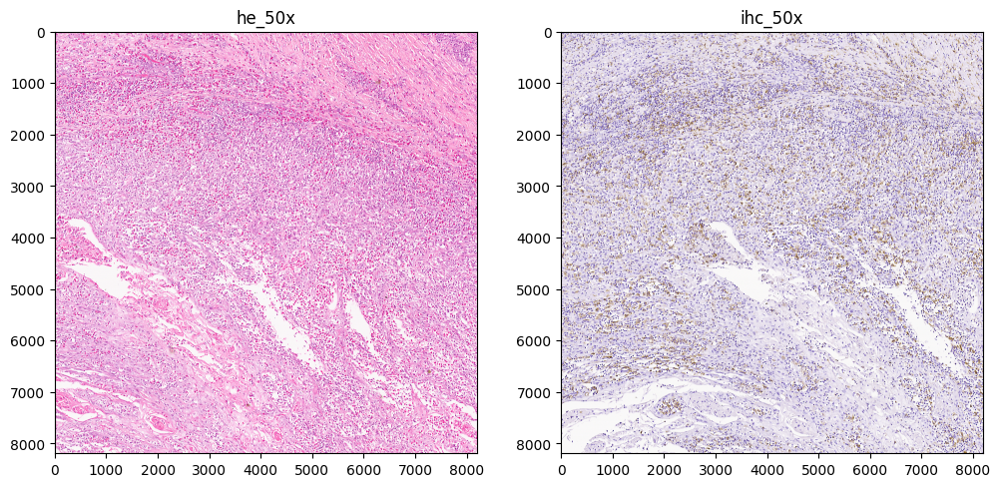

In [79]:
he = 'he_8192_shift.tiff'
ihc = 'ihc_8192_shift.tiff'



ihc = Image.open(ihc)
he = Image.open(he)
print("ihc:",ihc.size)
print("he:",he.size)
fig, axes = plt.subplots(1,2,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he_50x")
axes[1].imshow(ihc)
axes[1].set_title("ihc_50x")

[[ 1.00022822e+00 -9.41659577e-04  2.61698726e+03]
 [ 9.41659577e-04  1.00022822e+00  5.97541364e+01]] 2616.9872566607637 59.75413635140134 0.05394079334263337


Text(0.5, 1.0, 'registered.tiff')

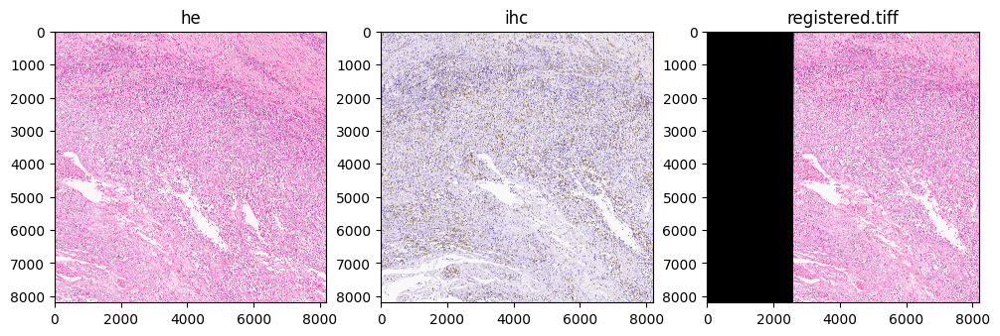

In [81]:
he = 'he_8192_shift.tiff'
ihc = 'ihc_8192_shift.tiff'


target_image = cv2.imread(ihc)
reference_image = cv2.imread(he)

registered_image, transformation_matrix,tx,ty,rotation_deg = tile_wise_registration(reference_image, target_image,5000)
cv2.imwrite("registered_X.tiff", registered_image)
print(transformation_matrix,tx,ty,rotation_deg)



ihc = Image.open(ihc)
he = Image.open(he)
registered_image = Image.open("registered_X.tiff")
fig, axes = plt.subplots(1,3,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he")
axes[1].imshow(ihc)
axes[1].set_title("ihc")
axes[2].imshow(registered_image)
axes[2].set_title("registered.tiff")

In [84]:

he  = 'CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01R3309HE/CAIB-T00000594OC01R01R3309HE.svs'
ihc ='CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01R3309CD3/CAIB-T00000594OC01R01R3309CD3.svs'

#w,h=core.get_pixel_dimensions(slide,sessionID=sessionID)
img=core.get_region(ihc,x= 43722 + 2616.9872566607637 ,y=40229 + 59.75413635140134 ,width=8192,height=8192,scale=1,rotation= 0.05394079334263337,sessionID=sessionID)
       
output_path = 'ihc_8192_C.tiff'
img.save(output_path)

In [86]:
import cv2
import os

# Load the TIFF image
image = cv2.imread('he_8192_shift.tiff', cv2.IMREAD_UNCHANGED)

# Get the dimensions of the image
height, width = image.shape[:2]

# Define the patch size
patch_size = 256

# Create the directory to save patches if it doesn't exist
save_dir = 'pa_he_c'
os.makedirs(save_dir, exist_ok=True)

# Iterate over the image and extract patches
for y in range(0, height, patch_size):
    for x in range(0, width, patch_size):
        patch = image[y:y+patch_size, x:x+patch_size]
        patch_filename = os.path.join(save_dir, f'patch_{y}_{x}.png')
        cv2.imwrite(patch_filename, patch)

In [129]:

he  = 'CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01R3309HE/CAIB-T00000594OC01R01R3309HE.svs'
ihc ='CAIB_WSI/CAIB/CAIB-T00000594OC/CAIB-T00000594OC01R01/CAIB-T00000594OC01R01R3309CD3/CAIB-T00000594OC01R01R3309CD3.svs'

w,h=core.get_pixel_dimensions(he,sessionID=sessionID)
img=core.get_region(ihc,x = 50.79079748765049 ,y= -117.29034203037233 ,width= w,height=h,scale= 0.03125,rotation=-0.006023704870645703

 ,sessionID=sessionID)
       
output_path = 'ihc_M.tiff'
img.save(output_path)

ihc: (1562, 3344)
he: (1562, 3344)


Text(0.5, 1.0, 'ihc_50x')

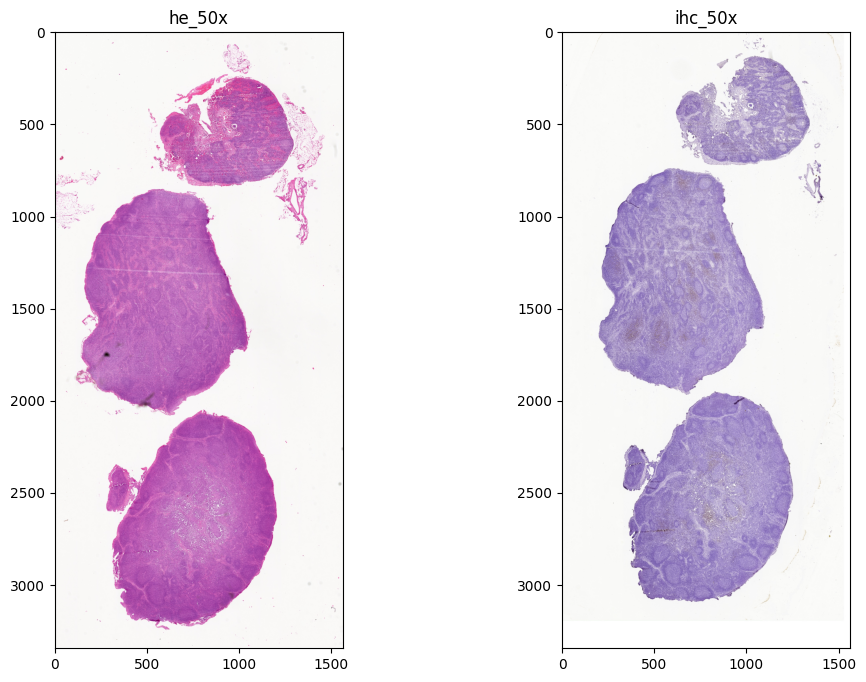

In [130]:
he = 'he_M.tiff'
ihc = 'ihc_M.tiff'



ihc = Image.open(ihc)
he = Image.open(he)
print("ihc:",ihc.size)
print("he:",he.size)
fig, axes = plt.subplots(1,2,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he_50x")
axes[1].imshow(ihc)
axes[1].set_title("ihc_50x")

In [87]:
#similarity check

[[ 9.99842359e-01  1.05116910e-04  5.07907975e+01]
 [-1.05116910e-04  9.99842359e-01 -1.17290342e+02]] 50.79079748765049 -117.29034203037233 -0.006023704870645703


Text(0.5, 1.0, 'registered.tiff')

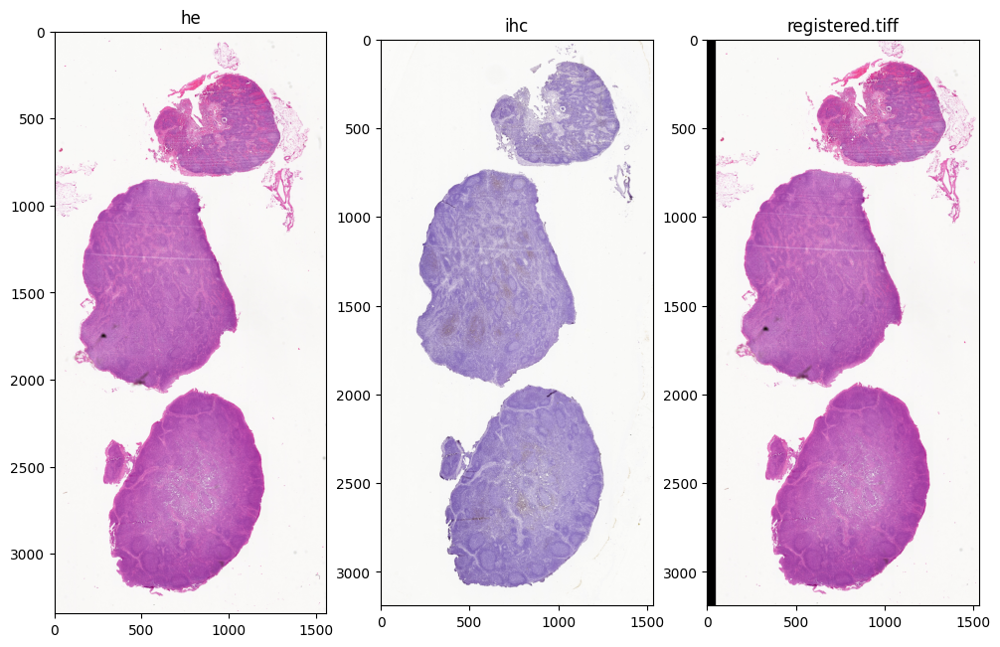

In [128]:
he = 'he_M.tiff'
ihc = 'ihc_M.tiff'


target_image = cv2.imread(ihc)
reference_image = cv2.imread(he)

registered_image, transformation_matrix,tx,ty,rotation_deg = tile_wise_registration(reference_image, target_image,5000)
cv2.imwrite("registered_X.tiff", registered_image)
print(transformation_matrix,tx,ty,rotation_deg)



ihc = Image.open(ihc)
he = Image.open(he)
registered_image = Image.open("registered_X.tiff")
fig, axes = plt.subplots(1,3,figsize = (12,8))
axes[0].imshow(he)
axes[0].set_title("he")
axes[1].imshow(ihc)
axes[1].set_title("ihc")
axes[2].imshow(registered_image)
axes[2].set_title("registered.tiff")

In [143]:
#cv2 similarity

import cv2

def compare_images(image1_path, image2_path):
    # Load images
    image1 = cv2.imread(image1_path)
    image2 = cv2.imread(image2_path)
    
    # Convert images to grayscale
    gray_image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray_image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
    
    # Compute Structural Similarity Index (SSIM)
    similarity_score = cv2.matchTemplate(gray_image1, gray_image2, cv2.TM_CCOEFF_NORMED)[0][0]
    
    return similarity_score

def main():
    image1_path = 'he_M.tiff'  # Replace with the path to your first image
    image2_path = 'ihc_M.tiff'  # Replace with the path to your second image

    similarity_score = compare_images(image1_path, image2_path)
    print('similarity between two images :',similarity_score)
    

if __name__ == "__main__":
    main()


similarity between two images : 0.607599


Similarity Score: 54.283%


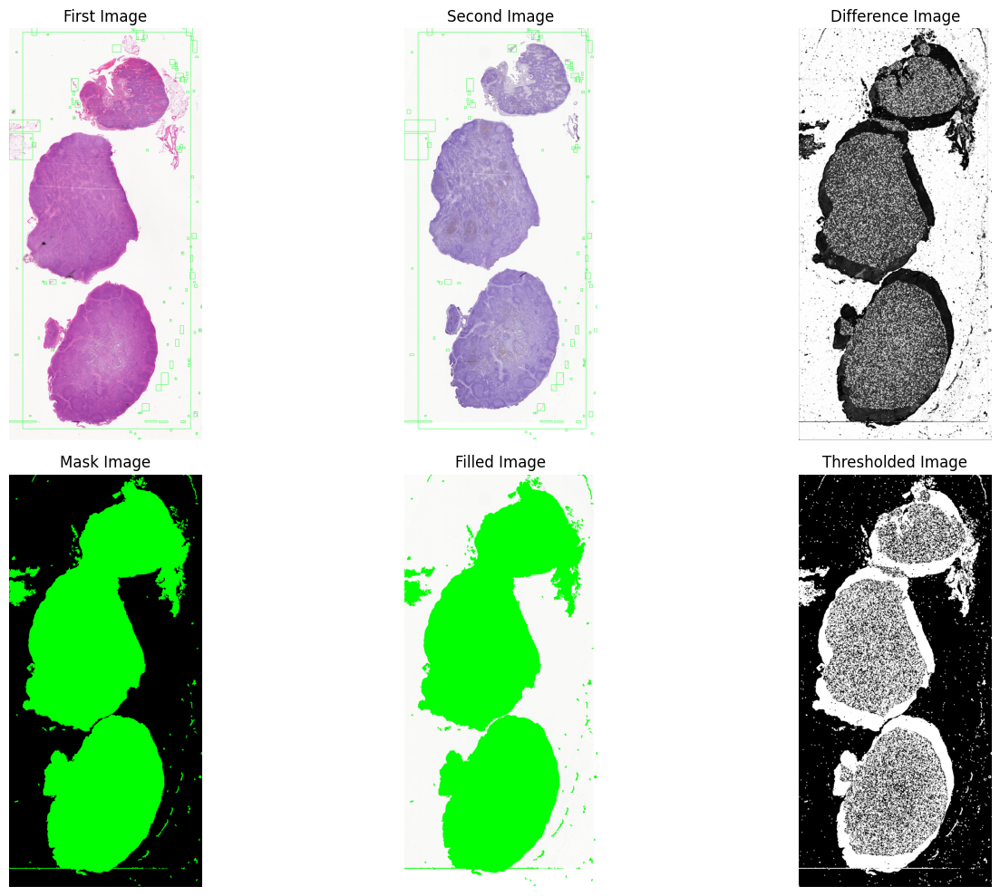

In [141]:
#scikit similarity



from skimage.metrics import structural_similarity
import cv2
import numpy as np
import matplotlib.pyplot as plt

first = cv2.imread('he_M.tiff')
second = cv2.imread('ihc_M.tiff')

# Convert images to grayscale
first_gray = cv2.cvtColor(first, cv2.COLOR_BGR2GRAY)
second_gray = cv2.cvtColor(second, cv2.COLOR_BGR2GRAY)

# Compute SSIM between two images
score, diff = structural_similarity(first_gray, second_gray, full=True)
print("Similarity Score: {:.3f}%".format(score * 100))

# The diff image contains the actual image differences between the two images
# and is represented as a floating point data type so we must convert the array 
# to 8-bit unsigned integers in the range [0,255] before we can use it with OpenCV
diff = (diff * 255).astype("uint8")

# Threshold the difference image, followed by finding contours to
# obtain the regions that differ between the two images
thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
contours = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = contours[0] if len(contours) == 2 else contours[1]

# Highlight differences
mask = np.zeros(first.shape, dtype='uint8')
filled = second.copy()

for c in contours:
    area = cv2.contourArea(c)
    if area > 100:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(first, (x, y), (x + w, y + h), (36,255,12), 2)
        cv2.rectangle(second, (x, y), (x + w, y + h), (36,255,12), 2)
        cv2.drawContours(mask, [c], 0, (0,255,0), -1)
        cv2.drawContours(filled, [c], 0, (0,255,0), -1)

# Display images using matplotlib
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Original images
axes[0, 0].imshow(cv2.cvtColor(first, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('First Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(cv2.cvtColor(second, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title('Second Image')
axes[0, 1].axis('off')

# Difference image
axes[0, 2].imshow(diff, cmap='gray')
axes[0, 2].set_title('Difference Image')
axes[0, 2].axis('off')

# Mask image
axes[1, 0].imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title('Mask Image')
axes[1, 0].axis('off')

# Filled image
axes[1, 1].imshow(cv2.cvtColor(filled, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title('Filled Image')
axes[1, 1].axis('off')

# Thresholded image
axes[1, 2].imshow(thresh, cmap='gray')
axes[1, 2].set_title('Thresholded Image')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


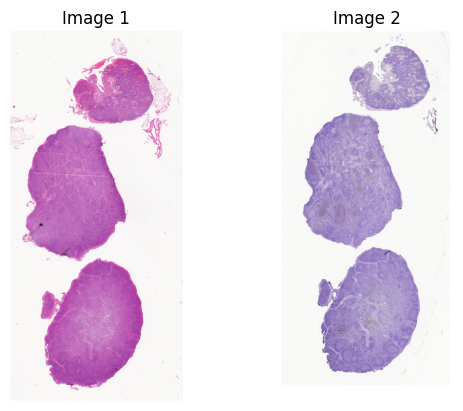

Text(0.5, 0.98, 'Similarity Score: 94.261%')

In [11]:

#sentence transformer open AI similarity


from sentence_transformers import SentenceTransformer, util
from PIL import Image
import matplotlib.pyplot as plt
import os

# Load the OpenAI CLIP Model
#print('Loading CLIP Model...')
model = SentenceTransformer('clip-ViT-B-32')

# Load and encode the two images
image_path1 = 'he_M.tiff'
image_path2 = 'ihc_M.tiff'

# Load images
image1 = Image.open(image_path1)
image2 = Image.open(image_path2)

# Encode images
encoded_image1 = model.encode(image1)
encoded_image2 = model.encode(image2)

# Compute cosine similarity between the two images' embeddings
similarity_score = util.pytorch_cos_sim(encoded_image1, encoded_image2)[0][0]

# Plot images and show similarity score
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(image1)
ax1.set_title('Image 1')
ax1.axis('off')
ax2.imshow(image2)
ax2.set_title('Image 2')
ax2.axis('off')
plt.show()

fig.suptitle('Similarity Score: {:.3f}%'.format(similarity_score * 100))